# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Lines Project** 
***
In this project, your goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. 

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

## Import Packages

In [1]:
#importing some useful packages
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from skimage import color
%matplotlib inline

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

['camera_cal/calibration1.jpg']


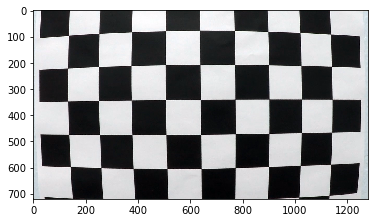

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((5*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:5].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration1.jpg')
print(images)
image = cv2.imread('camera_cal/calibration1.jpg')
plt.imshow(image)

ret is True


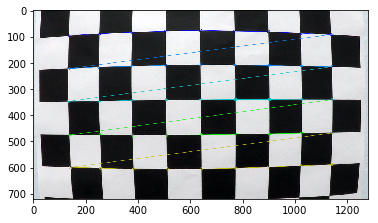

In [3]:
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,5), None)
    print("ret is",ret)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,5), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)
        plt.imshow(img)
cv2.destroyAllWindows()


## Apply a distortion correction to raw images

img_size 1280 720


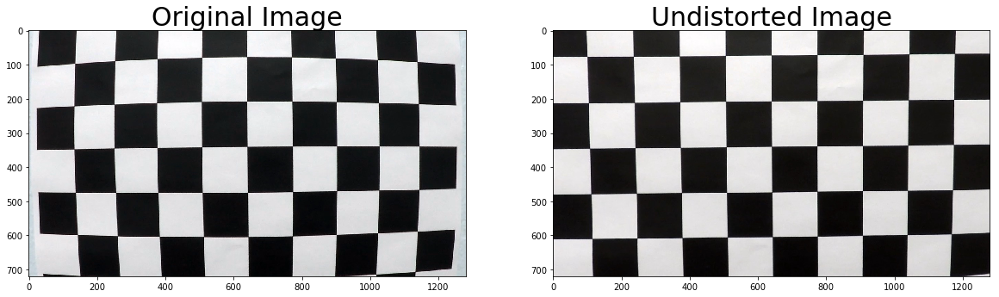

In [4]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = image
img_size = (img.shape[1], img.shape[0])
print("img_size",img.shape[1], img.shape[0])
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

f.savefig('./output_images/original_undistorted.png') 

### Apply distortion correction to test image

In [5]:
# Make a list of test images
images_straight_lines = glob.glob('test_images/straight_line*.jpg')
images_test = glob.glob('test_images/test*.jpg')

#Array for undistortion images
images_straight_lines_undistortion = [] 
images_test_undistortion = []

#Array for warped images
images_straight_lines_warped = []
images_test_warped = []

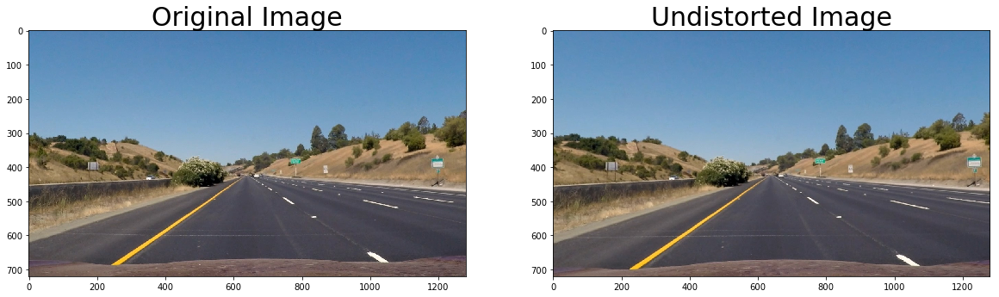

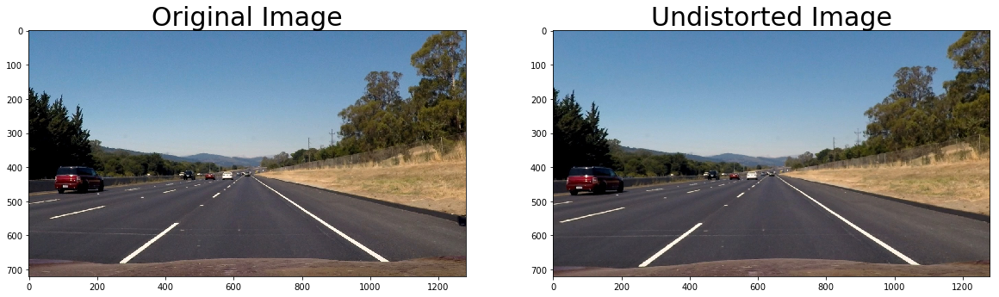

In [6]:
# Step through the list and undistort the images
for idx, fname in enumerate(images_straight_lines):
    
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(img, mtx, dist, None, mtx)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    
    f.savefig('./output_images/original_undistorted_example.png')
    
    images_straight_lines_undistortion.append(dst)

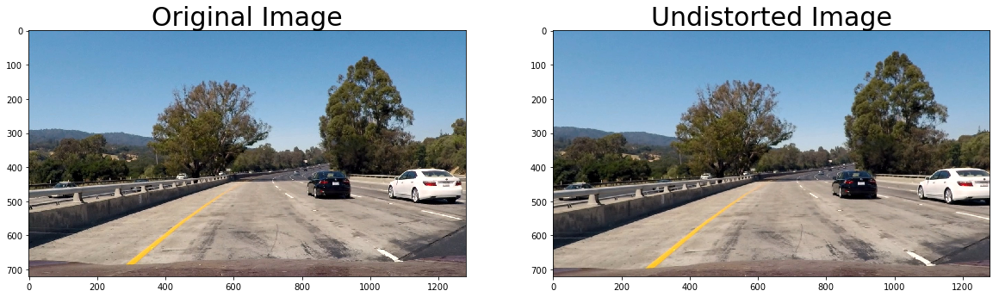

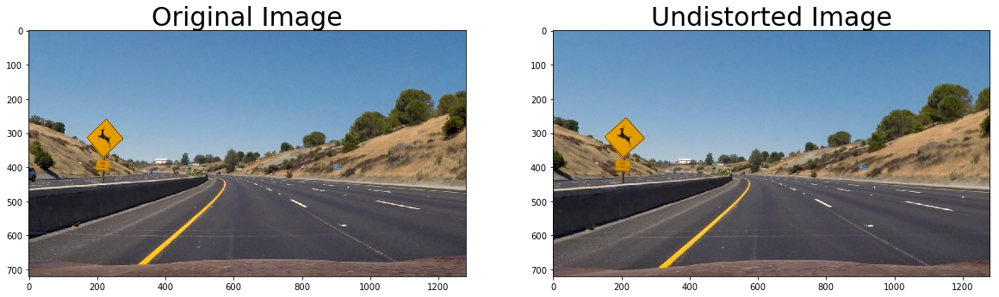

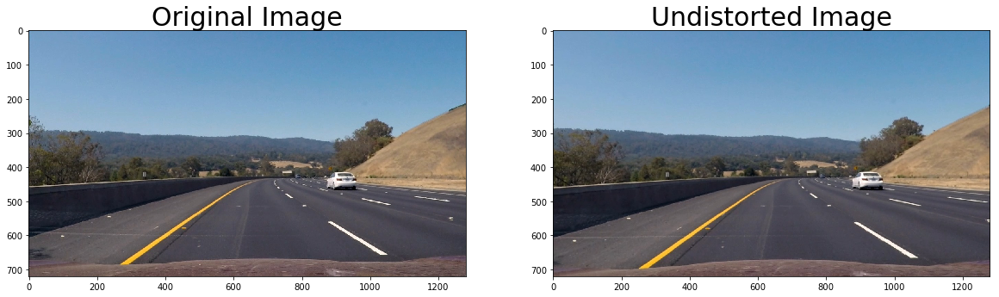

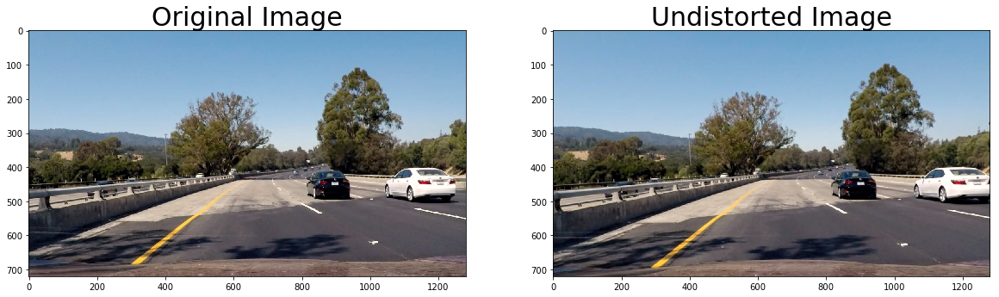

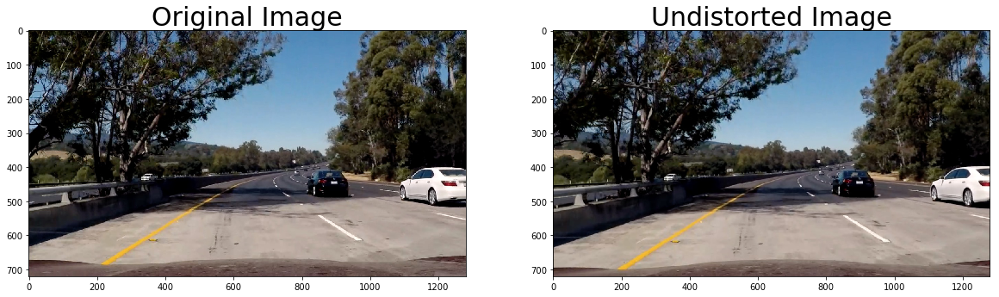

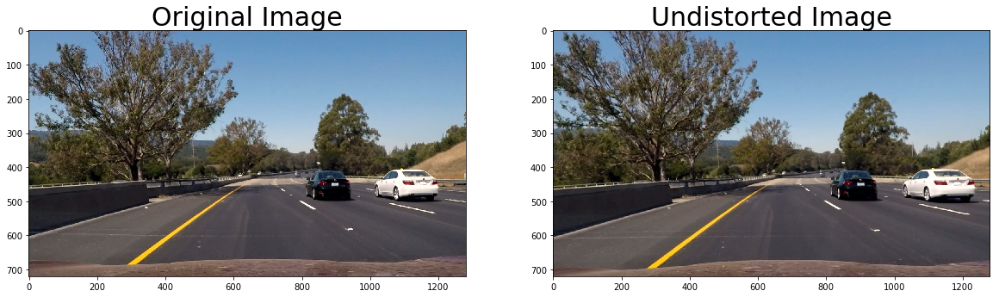

In [7]:
# Step through the list and undistort the images
for idx, fname in enumerate(images_test):
    
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    
    images_test_undistortion.append(dst)

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [8]:
# Define a function that thresholds the S-channel of HLS 
# Use exclusive lower bound (>) and inclusive upper (<=)  
def hls_select(img, thresh=(0, 255)):
    #1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    #2) Apply a threshold to the S channel
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    #3) Return a binary image of threshold result
    binary_output = binary
    return binary_output

#Define a function that convert color image to gray
def Color2Gray(img):
    # 1) Convert to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return img_gray

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3,abs_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    if orient == 'x':
        abs_sobelx = np.absolute(sobelx)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    elif orient == 'y':
        abs_sobely = np.absolute(sobely)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobel =np.sqrt(np.add(sobelx**2, sobely**2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 3) Calculate the magnitude 
    abs_sobel = np.arctan2(abs_sobely, abs_sobelx) 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    #scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(abs_sobel)
    sxbinary[(abs_sobel >= thresh[0]) & (abs_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output

# Edit this function to create your own pipeline.
def pipeline(img, sobel_kernel=3, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary

#Define a function that Only keeps the region of the image defined by the polygon
#formed from `vertices`. The rest of the image is set to black.
def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

### Run a test image with above funciton to tunne the parameter

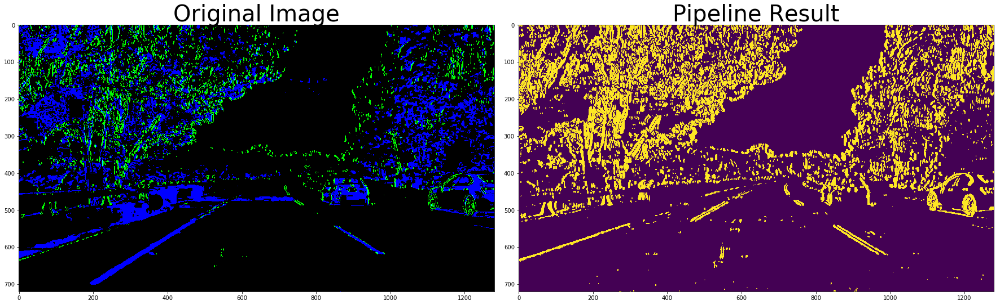

In [9]:
image = images_test_undistortion[4]
image_gray = Color2Gray(image)

result = pipeline(image, sobel_kernel=9, s_thresh=(120, 255), sx_thresh=(45, 100))
grad_result = abs_sobel_thresh(image_gray, sobel_kernel=15, orient='x', abs_thresh=(20,255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

plt.imshow(image)

ax1.imshow(result)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(grad_result)
ax2.set_title('Pipeline Result', fontsize=40)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig('./output_images/original_pipeline_example.png')

## Apply a perspective transform to rectify binary image ("birds-eye view").

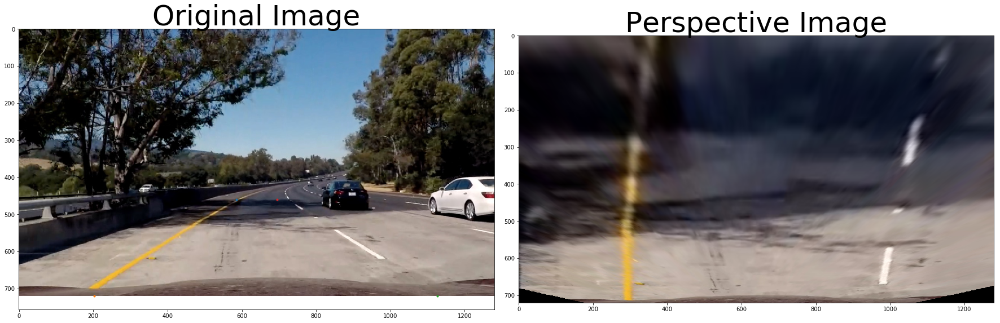

In [10]:
img_size = (image.shape[1], image.shape[0])

src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

src = np.float32([src[0], src[1], src[2], src[3]])
# For destination points, I'm arbitrarily choosing some points to be
# a nice fit for displaying our warped result 
# again, not exact, but close enough for our purposes
dst = np.float32([dst[0], dst[1], dst[2], dst[3]])
# Given src and dst points, calculate the perspective transform matrix
M = cv2.getPerspectiveTransform(src, dst)
# Warp the image using OpenCV warpPerspective()
warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.plot(src[0][0],src[0][1],'.')
ax1.plot(src[1][0],src[1][1],'.')
ax1.plot(src[2][0],src[2][1],'.')
ax1.plot(src[3][0],src[3][1],'.')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Perspective Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f.savefig('./output_images/original_perspective_example.png')

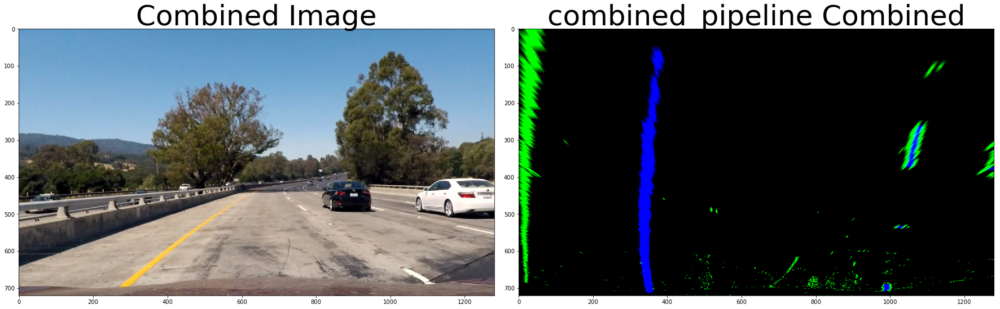

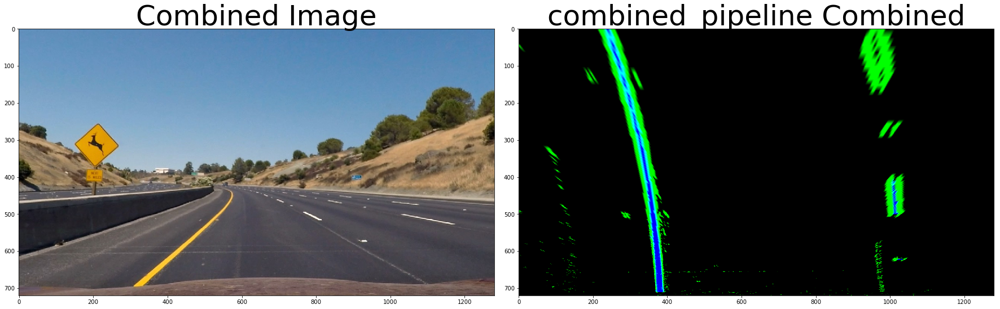

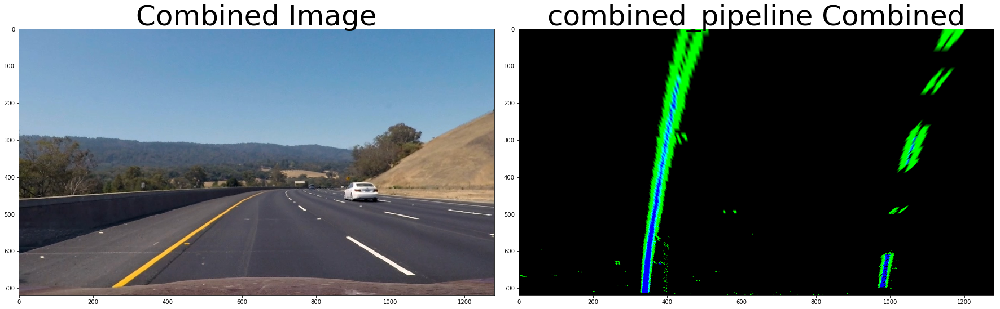

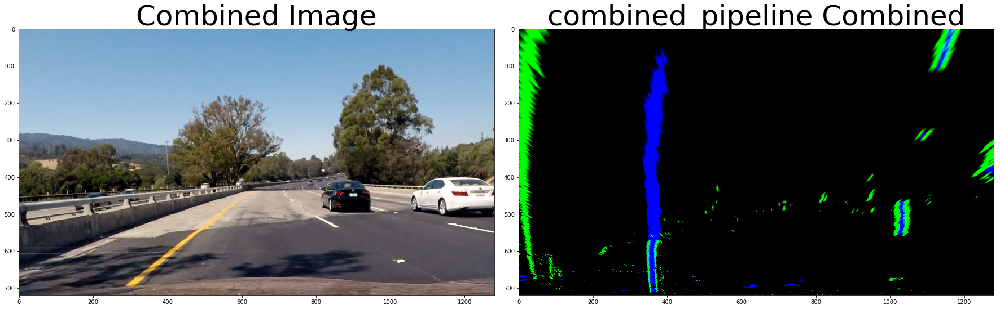

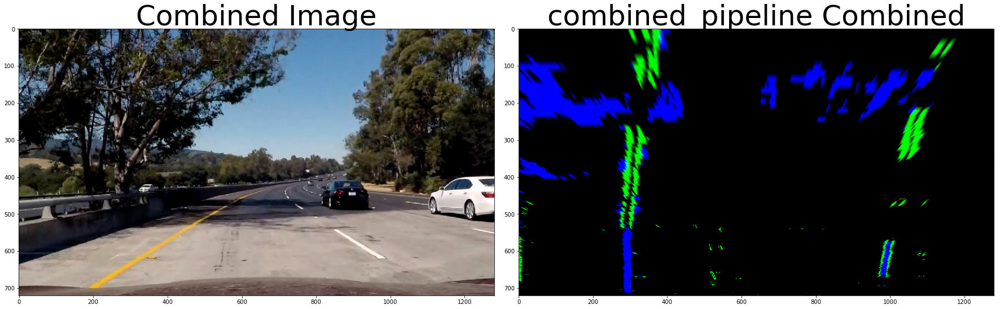

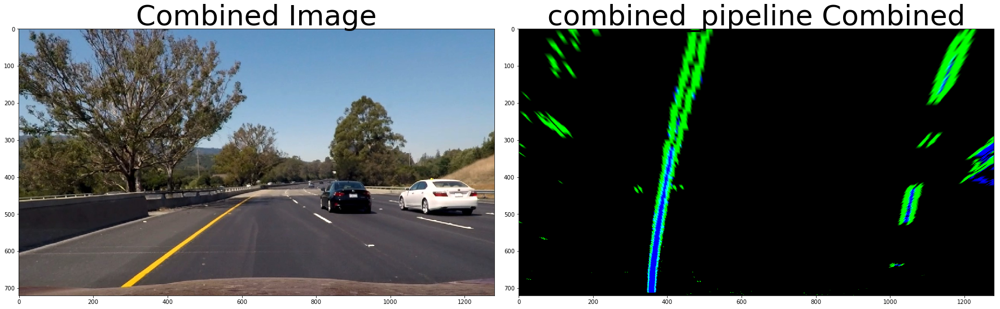

In [11]:
for image in images_test_undistortion:
    pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(150, 255), sx_thresh=(20, 255))
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(pipeline_image, M, img_size, flags=cv2.INTER_LINEAR)
    
    images_test_warped.append(warped)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Combined Image', fontsize=50)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('combined_pipeline Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    f.savefig('./output_images/original_combine_pipeline_example.png')

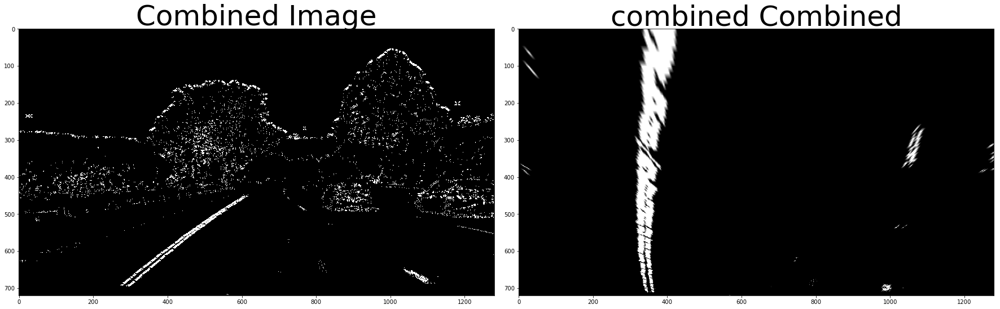

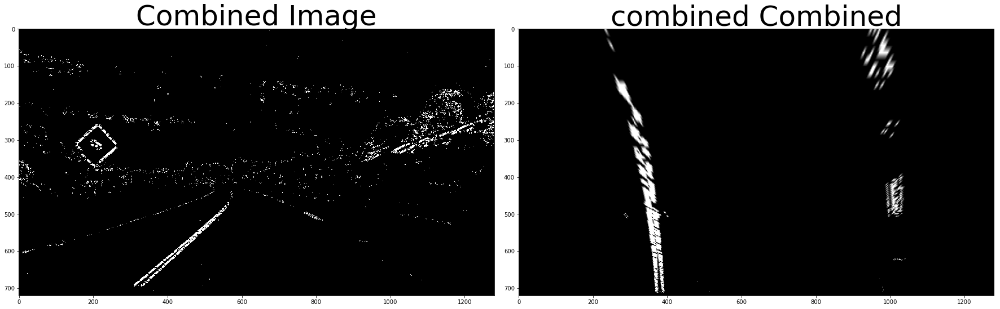

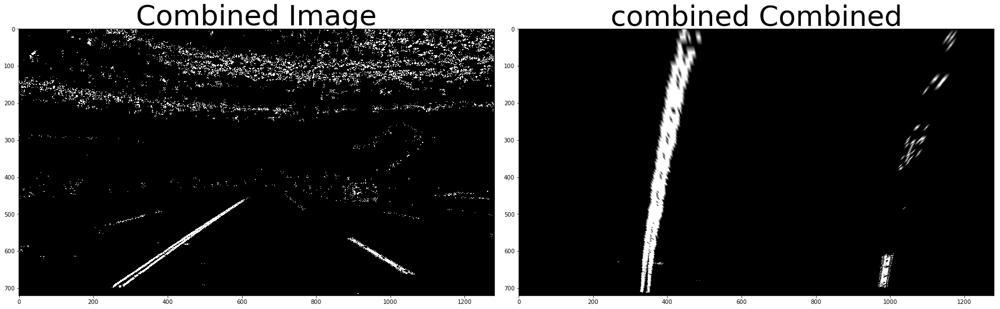

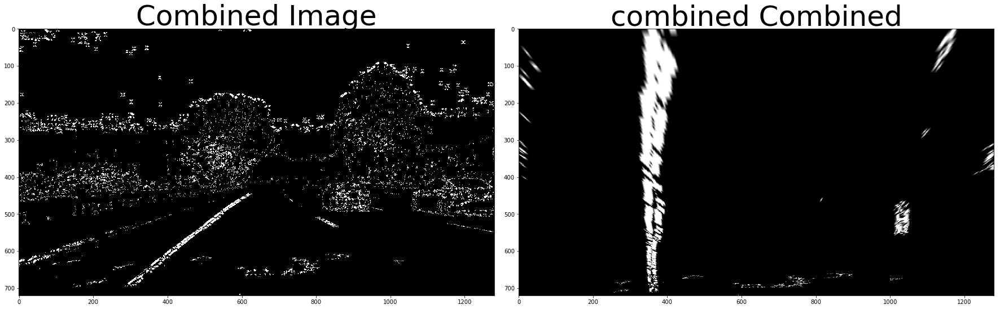

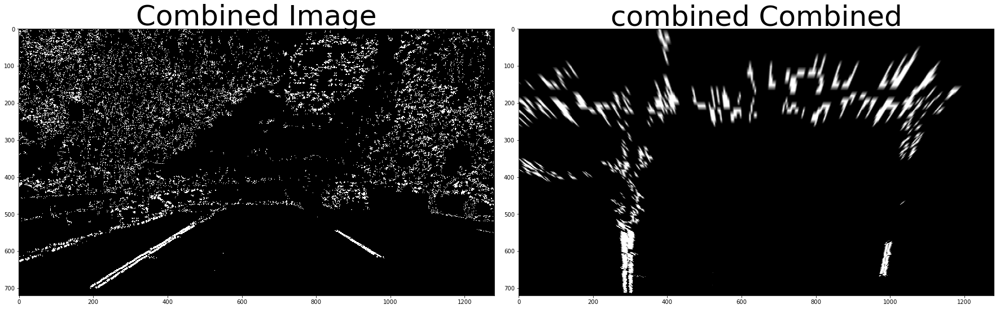

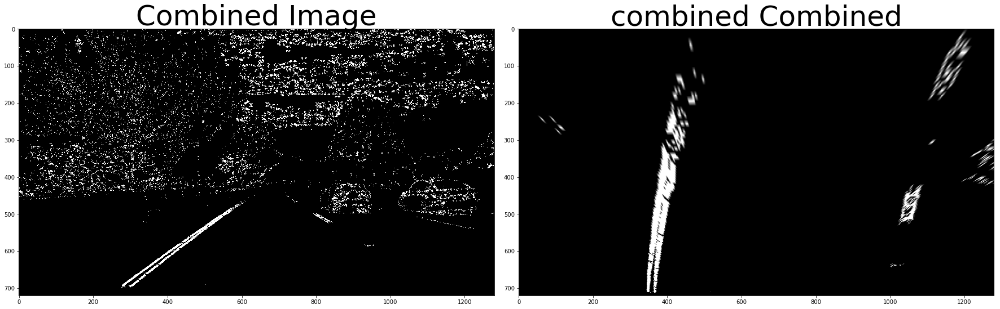

In [12]:
for image in images_test_undistortion:
    #pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(130, 255), sx_thresh=(48, 100))
    pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(110, 255), sx_thresh=(48, 100))
    
    binary_pipeline = color.rgb2gray(pipeline_image/255.0)
    binary_pipeline[binary_pipeline > 0] = 1
    
    dir_binary = dir_threshold(binary_pipeline, sobel_kernel=9, thresh=(0.7, 1.3))
    grad_result = abs_sobel_thresh(binary_pipeline, sobel_kernel=9, orient='x', abs_thresh=(50,255))
    
    combined_pipeline = np.zeros_like(dir_binary)
    combined_pipeline[((binary_pipeline == 1) & (dir_binary == 1))] = 1
    
    #Region of interest
    region_ver = np.array( [[[100,720],[600,380],[700,380],[1280,720]]], dtype=np.int32 )
    pipeline_image_interest = region_of_interest(combined_pipeline, region_ver)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(pipeline_image_interest, M, img_size, flags=cv2.INTER_LINEAR)
    
    #images_test_warped.append(warped)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_pipeline, cmap='gray')
    ax1.set_title('Combined Image', fontsize=50)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('combined Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    f.savefig('./output_images/original_combine_example.png')

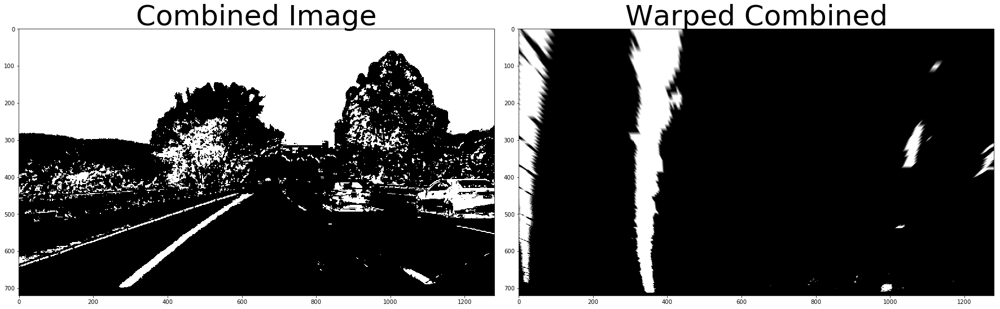

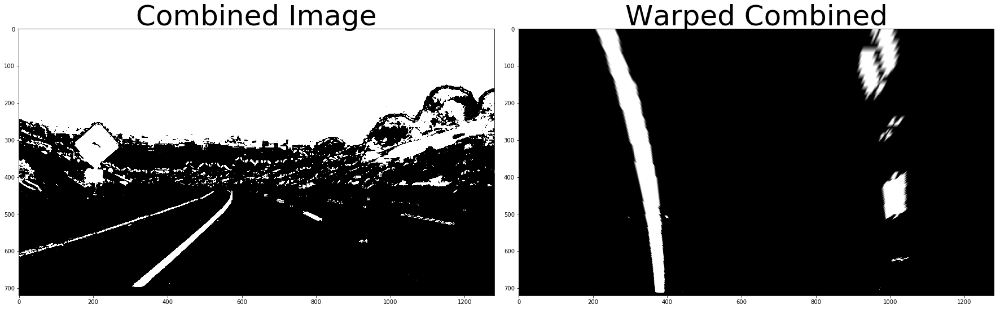

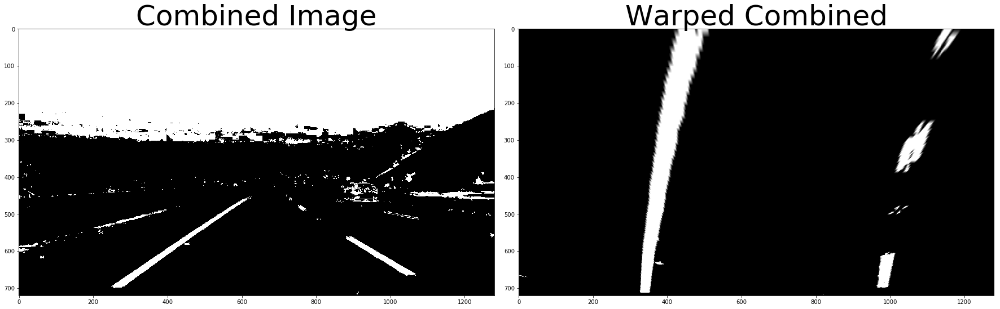

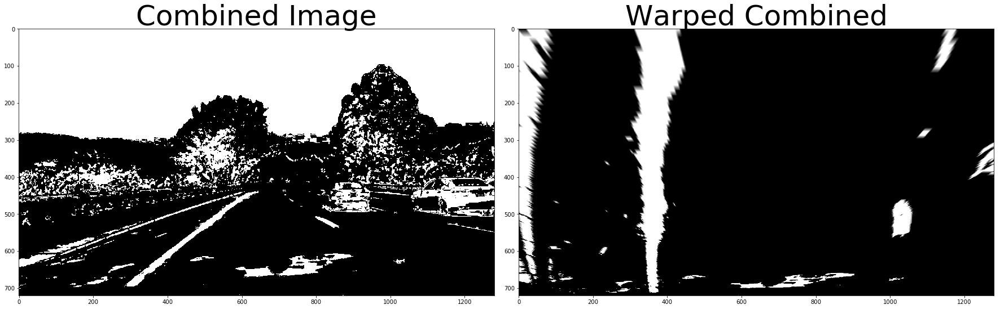

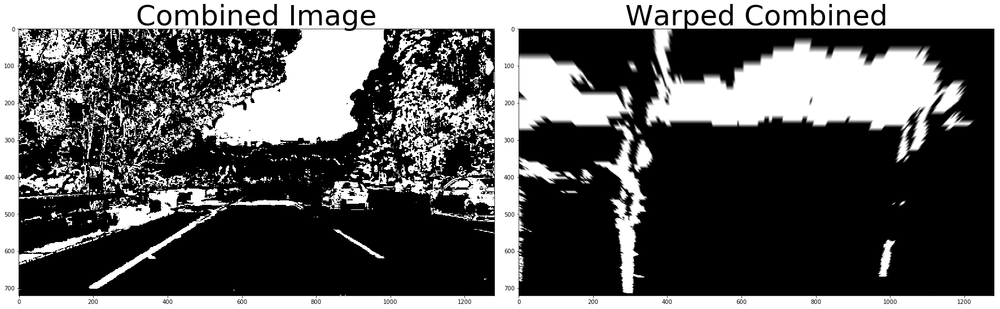

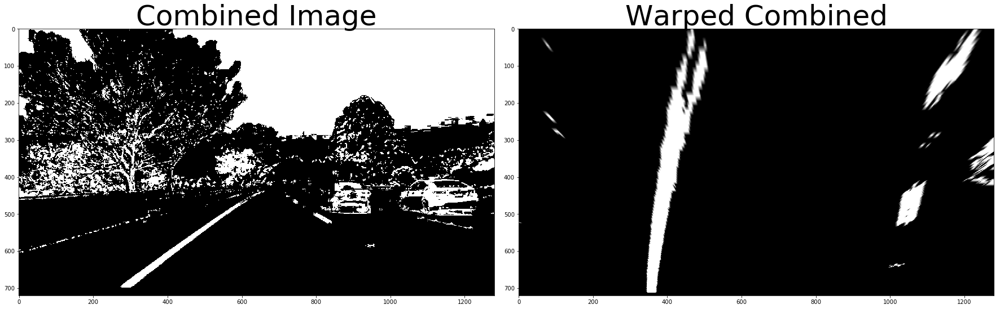

In [13]:
for image in images_test_undistortion:
        
    hls_binary = hls_select(image, thresh=(90, 255)) 
    hls_binary = color.rgb2gray(hls_binary/255.0)
    hls_binary[hls_binary > 0] = 1
    gradx_hls = abs_sobel_thresh(hls_binary, sobel_kernel=15, orient='x', abs_thresh=(50,255))
    
    image_gray = Color2Gray(image)
    gradx = abs_sobel_thresh(image_gray, sobel_kernel=9, orient='x', abs_thresh=(40,255))
    grady = abs_sobel_thresh(image_gray, sobel_kernel=15, orient='y', abs_thresh=(50,255))
    mag_binary = mag_thresh(image_gray, sobel_kernel=15, mag_thresh=(80, 255))
    dir_binary = dir_threshold(image_gray, sobel_kernel=15, thresh=(0.7, 1.3))

    combined_2 = np.zeros_like(dir_binary)
    combined_2[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    #Region of interest
    #region_ver = np.array( [[[100,720],[600,350],[700,350],[1280,720]]], dtype=np.int32 )
    #pipeline_image_interest = region_of_interest(pipeline_image, region_ver)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(combined_2, M, img_size, flags=cv2.INTER_LINEAR)
    
    #images_test_warped.append(warped)
    #images_test_warped.append(hls_binary)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_2, cmap='gray')
    ax1.set_title('Combined Image', fontsize=50)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('Warped Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    f.savefig('./output_images/original_combine2_example.png')

## Detect lane pixels and fit to find the lane boundary.

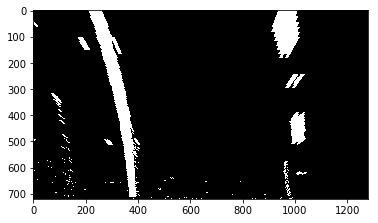

In [14]:
binary_warped = images_test_warped[1]
binary_warped = color.rgb2gray(binary_warped/255.0)
binary_warped[binary_warped > 0] = 1

plt.imshow(binary_warped, cmap='gray')

/Users/Sukii/anaconda/envs/P1_python35/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


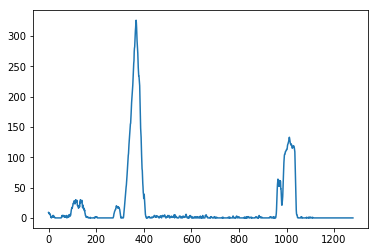

In [15]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

In [16]:
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

#print("Leftx_base: ", leftx_base, "Rightx_base: ", rightx_base)

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #print("leftx_current: ", leftx_current, "rightx_current: ", rightx_current)
 
#Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

/Users/Sukii/anaconda/envs/P1_python35/lib/python3.5/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


In [17]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

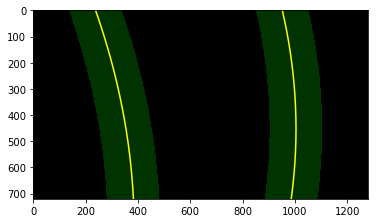

In [18]:
#Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

plt.savefig('./output_images/line_fit_example.png')

## Determine the curvature of the lane and vehicle position with respect to center

In [19]:
y_eval = np.max(ploty)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

2815.91658867 m 2100.63604836 m


## Warp the detected lane boundaries back onto the original image.

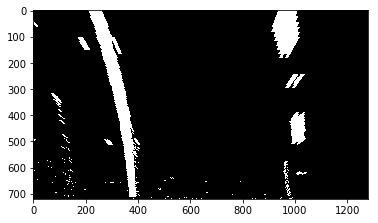

In [20]:
binary_warped = out_img
binary_warped = color.rgb2gray(binary_warped/255.0)
binary_warped[binary_warped > 0] = 1

plt.imshow(binary_warped, cmap='gray')

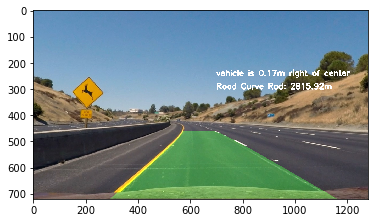

In [21]:
# Given src and dst points, calculate the perspective transform matrix
M_unwarped = cv2.getPerspectiveTransform(dst, src)
# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, M_unwarped, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(images_test_undistortion[1], 1, newwarp, 0.3, 0)

#Calculate distance of car and line center
distance_center = ((leftx_current + rightx_current)/2 - 1280/2)*xm_per_pix
if distance_center > 0:
    distance_center_abs = abs(distance_center)
    Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m left of center"
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)
else:
    distance_center_abs = abs(distance_center)
    Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m right of center"
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)

# Add curverad value into result image
curverad = (left_curverad+left_curverad)/2
Text_curverad = "Road Curve Rad: " + str('%.2f' % curverad) + "m"
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(result, Text_curverad,(700,300), font, 1,(255,255,255),4)

plt.imshow(result)
plt.savefig('./output_images/line_curverad_example.png')

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [22]:
# Given src and dst points, calculate the perspective transform matrix
M = cv2.getPerspectiveTransform(src, dst)
# Given dst and src points, calculate the perspective inverse transform matrix
M_unwarped = cv2.getPerspectiveTransform(dst, src)
#Region of interest
region_ver = np.array( [[[100,720],[600,400],[700,400],[1280,720]]], dtype=np.int32 )


In [23]:
def Advanced_lane_line(img):   
    #img = cv2.imread(frame)
    img_interest = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(img_interest, mtx, dist, None, mtx)
    image = dst
    image_gray = Color2Gray(image)
    
    pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(100, 255), sx_thresh=(48, 100))
    
    binary_pipeline = color.rgb2gray(pipeline_image/255.0)
    binary_pipeline[binary_pipeline > 0] = 1
    
    #dir_binary = dir_threshold(image_gray, sobel_kernel=3, thresh=(0.7, 1.3))

    #combined_pipeline = np.zeros_like(dir_binary)
    #combined_pipeline[((binary_pipeline == 1) & (dir_binary == 1))] = 1

    combined_pipeline_interest = region_of_interest(binary_pipeline, region_ver)
    
    # Warp the image using OpenCV warpPerspective()
    binary_warped = cv2.warpPerspective(combined_pipeline_interest, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #print("leftx_current: ", leftx_current, "rightx_current: ", rightx_current)

    #Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_unwarped, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    #Calculate distance of car and line center
    distance_center = ((leftx_current + rightx_current)/2 - 1280/2)*xm_per_pix
    if distance_center > 0:
        distance_center_abs = abs(distance_center)
        Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m left of center"
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)
    else:
        distance_center_abs = abs(distance_center)
        Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m right of center"
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)
    
    curverar = (left_curverad+left_curverad)/2
    Text_curverad = "Road Curve Rad: " + str('%.2f' % curverar) + "m"
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, Text_curverad,(700,300), font, 1,(255,255,255),4)

    return result

/Users/Sukii/anaconda/envs/P1_python35/lib/python3.5/site-packages/ipykernel/__main__.py:26: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


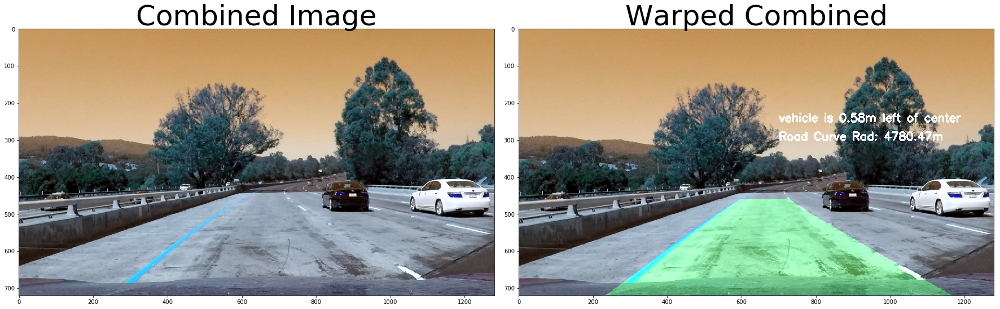

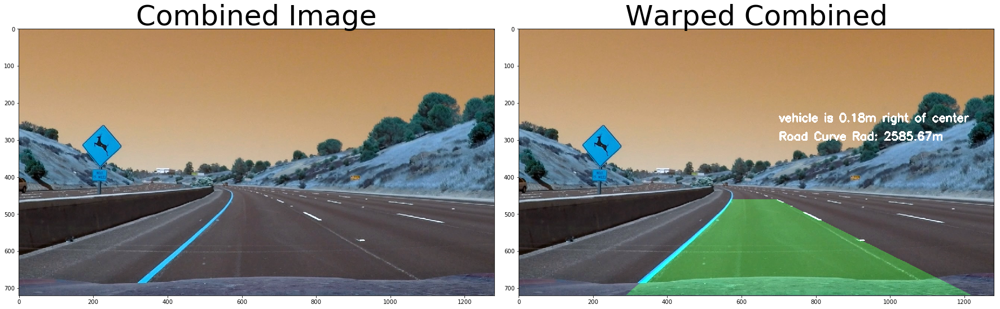

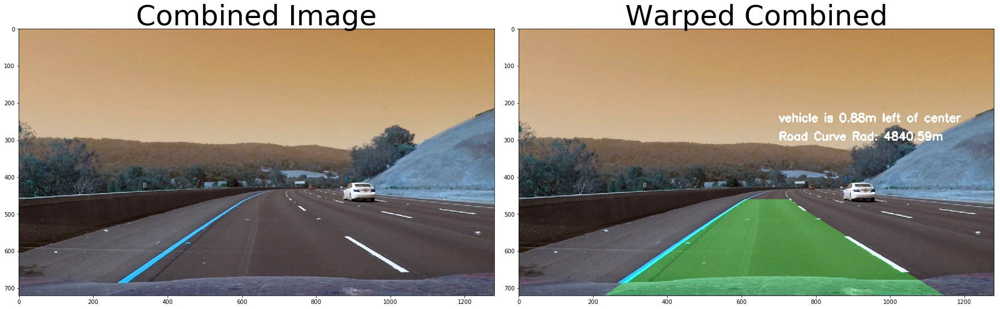

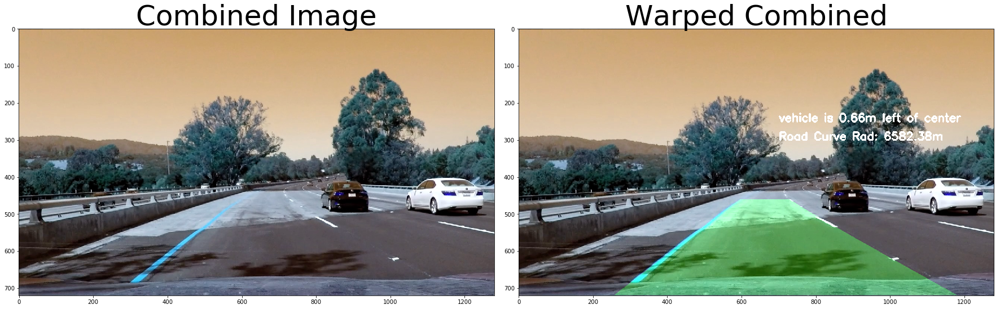

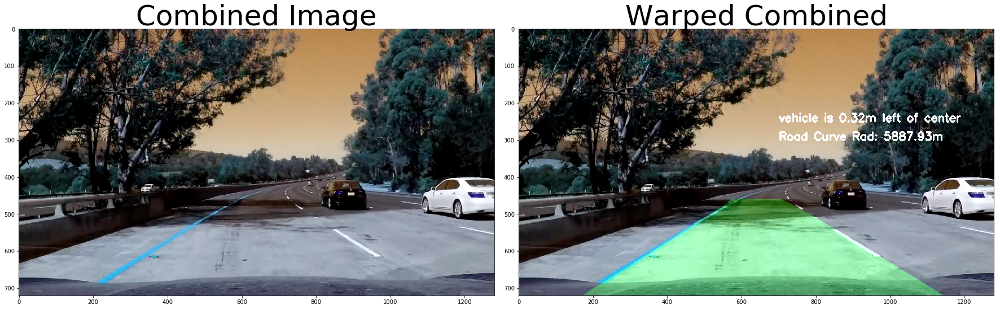

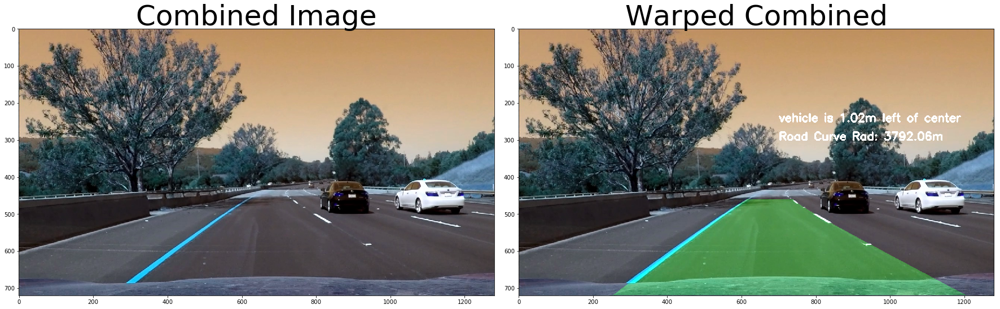

In [24]:
for fname in images_test:
    imge = cv2.imread(fname)
    result = Advanced_lane_line(imge)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(imge)
    ax1.set_title('Combined Image', fontsize=50)
    ax2.imshow(result)
    ax2.set_title('Warped Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Video

In [25]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.left_fit = None
        self.right_fit = None

In [26]:
Line_info = Line()

In [27]:
def Advanced_lane_line_video(img):   
    #img = cv2.imread(frame)
    img_interest = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    dst = cv2.undistort(img_interest, mtx, dist, None, mtx)
    image = dst
    
    pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(100, 255), sx_thresh=(48, 100))
    #pipeline_image = pipeline(image, sobel_kernel=3, s_thresh=(150, 255), sx_thresh=(20, 255))
    
    binary_pipeline = color.rgb2gray(pipeline_image/255.0)
    binary_pipeline[binary_pipeline > 0] = 1
    
    '''
    image_gray = Color2Gray(image)
    dir_binary = dir_threshold(image_gray, sobel_kernel=15, thresh=(0.7, 1.3))

    combined_pipeline = np.zeros_like(dir_binary)
    combined_pipeline[((binary_pipeline == 1) & (dir_binary == 1))] = 1   
    '''
    
    combined_pipeline_interest = region_of_interest(binary_pipeline, region_ver)
    #combined_pipeline_interest = region_of_interest(binary_pipeline, region_ver)
    
    # Warp the image using OpenCV warpPerspective()
    binary_warped = cv2.warpPerspective(combined_pipeline_interest, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
        
    if Line_info.detected == False:
        
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            #print("leftx_current: ", leftx_current, "rightx_current: ", rightx_current)

        #Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        
        Line_info.detected = True
    else:
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        
        margin = 20
        left_lane_inds = ((nonzerox > (Line_info.left_fit[0]*(nonzeroy**2) + Line_info.left_fit[1]*nonzeroy + Line_info.left_fit[2] - margin)) & (nonzerox < (Line_info.left_fit[0]*(nonzeroy**2) + Line_info.left_fit[1]*nonzeroy + Line_info.left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (Line_info.right_fit[0]*(nonzeroy**2) + Line_info.right_fit[1]*nonzeroy + Line_info.right_fit[2] - margin)) & (nonzerox < (Line_info.right_fit[0]*(nonzeroy**2) + Line_info.right_fit[1]*nonzeroy + Line_info.right_fit[2] + margin)))  

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    Line_info.left_fit = left_fit = np.polyfit(lefty, leftx, 2)
    Line_info.right_fit = right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_unwarped, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    leftx_base = left_fit[0]*719*2 + left_fit[1]*719 + left_fit[2]
    rightx_base = right_fit[0]*719*2 + right_fit[1]*719 + right_fit[2]
    
    #Calculate distance of car and line center
    distance_center = ((leftx_base + rightx_base)/2 - 1280/2)*xm_per_pix
    if distance_center > 0:
        distance_center_abs = abs(distance_center)
        Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m left of center"
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)
    else:
        distance_center_abs = abs(distance_center)
        Text_center = "vehicle is " + str('%.2f' % distance_center_abs) + "m right of center"
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, Text_center,(700,250), font, 1,(255,255,255),4)
    
    #curverar = (left_curverad+left_curverad)/2
    curverar = left_curverad
    Text_curverad = "Road Curve Rad: " + str('%.2f' % curverar) + "m"
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, Text_curverad,(700,300), font, 1,(255,255,255),4)
    
    '''
    binary_pipeline_3 = np.dstack((binary_pipeline, binary_pipeline, binary_pipeline))*255
    output = result# function that warp image back to perspective view
    output1 = cv2.resize(binary_pipeline_3,(640, 360), interpolation = cv2.INTER_AREA)
    output2 = cv2.resize(color_warp,(640, 360), interpolation = cv2.INTER_AREA)

    # Create an array big enough to hold both images next to each other.
    vis = np.zeros((720, 1280+640, 3))

    # Copy both images into the composed image.
    vis[:720, :1280,:] = output
    vis[:360, 1280:1920,:] = output1
    vis[360:720, 1280:1920,:] = output2
    '''
    return result

In [28]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [29]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)

    return Advanced_lane_line_video(image)

In [30]:
white_output = 'project_video_result.mp4'
clip1 = VideoFileClip("project_video.mp4")#.subclip(37,43)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████▉| 1260/1261 [04:22<00:00,  4.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

CPU times: user 6min 54s, sys: 1min 8s, total: 8min 3s
Wall time: 4min 24s


In [31]:
'''
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_result.mp4"))
'''

'\nHTML("""\n<video width="960" height="540" controls>\n  <source src="{0}">\n</video>\n""".format("project_video_result.mp4"))\n'